In [1]:
import os
import scanpy as sc
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from scipy.linalg import eigh
from matplotlib.colors import TwoSlopeNorm
import matplotlib as mpl
import gseapy as gp
import seaborn as sns

In [2]:
figpath = '/stanley/WangLab/kamal/figures/projects/manifesto/juxtacrine_tonsil_fh/'
os.makedirs(figpath, exist_ok=True)
dpi = 500

In [3]:
def embed(adata, region, n_comps, filter_key):

    adata_region = adata[adata.obs['region']==region]
    adata_notregion = adata[adata.obs['region']!=region]

    X = adata_region.layers[filter_key]
    X -= X.mean(axis=0)
    A = X.T @ X

    X_ = adata_notregion.layers[filter_key]
    X_ -= X_.mean(axis=0)
    B = X_.T @ X_

    w,V = eigh(A,B)
    w = w[::-1]
    V = V[:,::-1]

    V = V[:,:n_comps]
    adata.obsm[f'X_pca_{filter_key}'] = adata.layers[filter_key] @ V
    adata.varm[f'X_pca_{filter_key}'] = V
    adata.uns[f'comp_var_{filter_key}'] = w

    return V

# Load

In [4]:
adata = sc.read_h5ad('/stanley/WangLab/kamal/data/technologies/xenium/tonsil_fh/filtered/adata_juxtacrine.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 1349474 × 377
    obs: 'transcript_counts', 'n_counts'
    uns: 'log1p'
    obsm: 'spatial'
    layers: 'juxtacrine'

In [6]:
filter_key = 'juxtacrine'
max_mag = 2

# Scale
sc.pp.scale(adata, layer=filter_key)

# Clip
X = adata.layers[filter_key]
X[X > max_mag] = max_mag
X[X < -max_mag] = -max_mag

In [7]:
# Check loading
filepath = '/stanley/WangLab/kamal/code/projects/manifesto/figures/tonsil_fh_regions.npy'
regions = np.load(filepath, allow_pickle=True)
adata.obs['region'] = regions

In [8]:
# Set figure size
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
set_width = 10
fignorm = set_width / width
sc.set_figure_params(figsize=(set_width, height*fignorm))
figsize=(set_width, height*fignorm)

# Region 3

## Compute interactions

In [9]:
n_comps = 5
filter_key = 'juxtacrine'
region = '3'

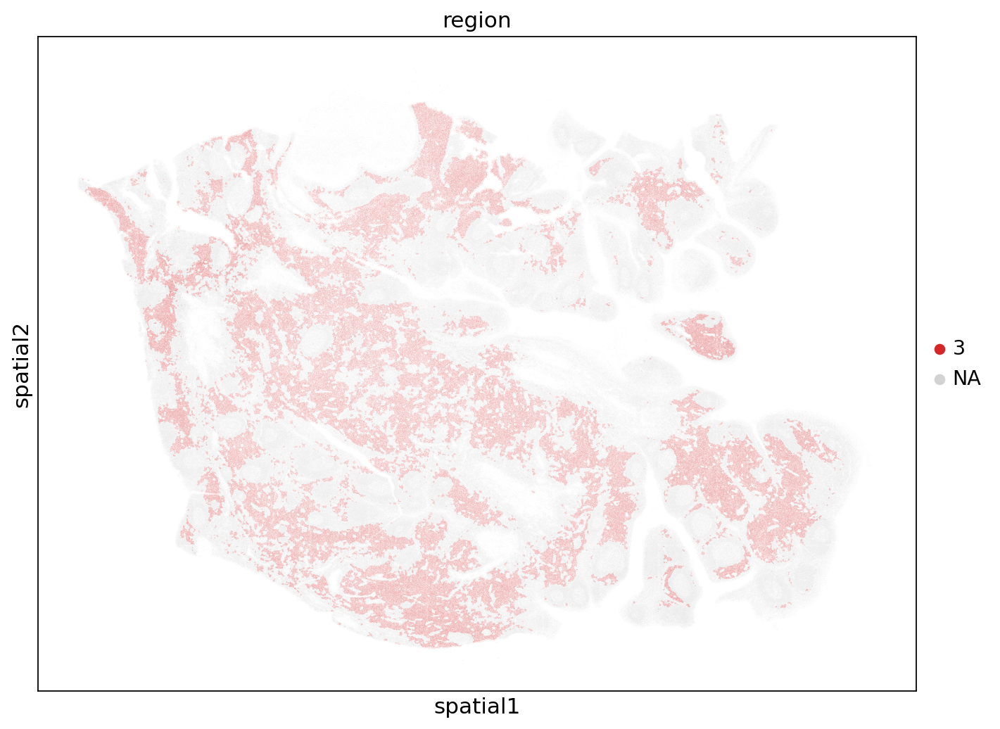

In [10]:
sc.pl.embedding(
    adata,
    basis='spatial',
    color='region',
    groups=region
)

In [11]:
V = embed(adata, region, n_comps, filter_key)

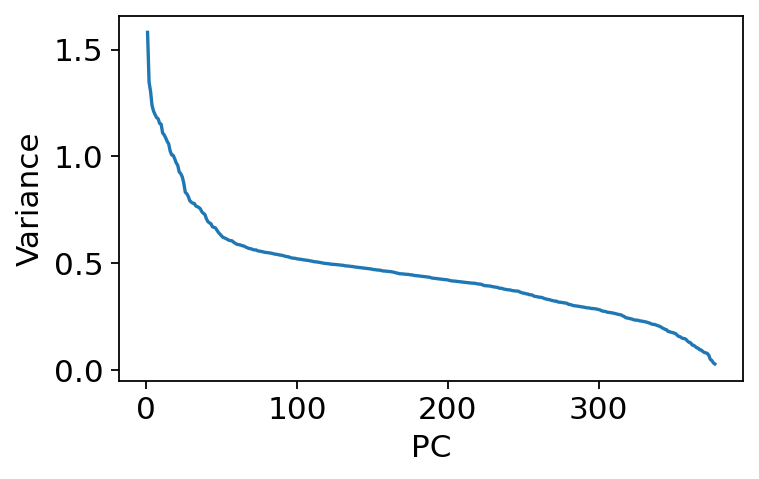

In [12]:
w = adata.uns[f'comp_var_{filter_key}']

plt.figure(figsize=(5,3))
plt.plot(np.arange(1,len(w)+1), w)
plt.xlabel('PC')
plt.ylabel('Variance')
plt.grid(None)
plt.show()

## Plot interactions

In [13]:
n_markers = 10

==================== PC1 ====================


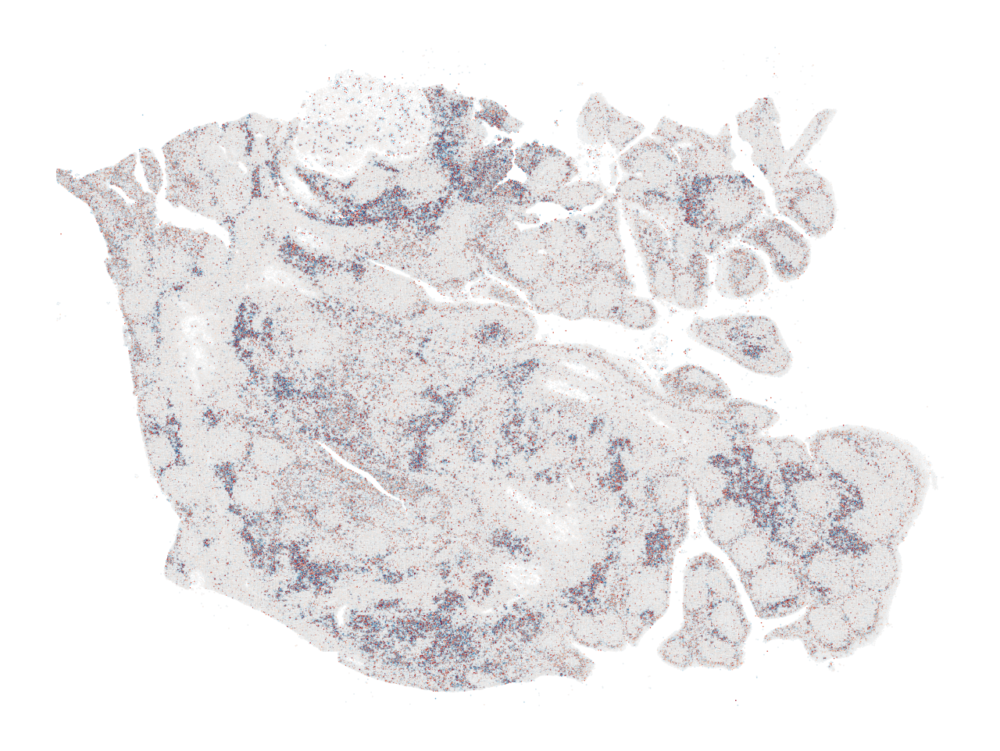

Positive markers:  ['CD247', 'CD8A', 'CD28', 'CD3D', 'C15orf48', 'SELL', 'CD4', 'DNASE1L3', 'CTLA4', 'PLA2G7']
Negative markers:  ['LAMP3', 'CCR7', 'CSF2RA', 'CCL19', 'CD83', 'BASP1', 'CD274', 'GPR183', 'IL7R', 'CD86']



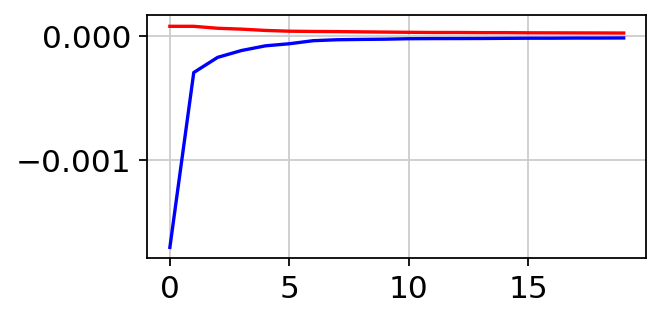

==================== PC2 ====================


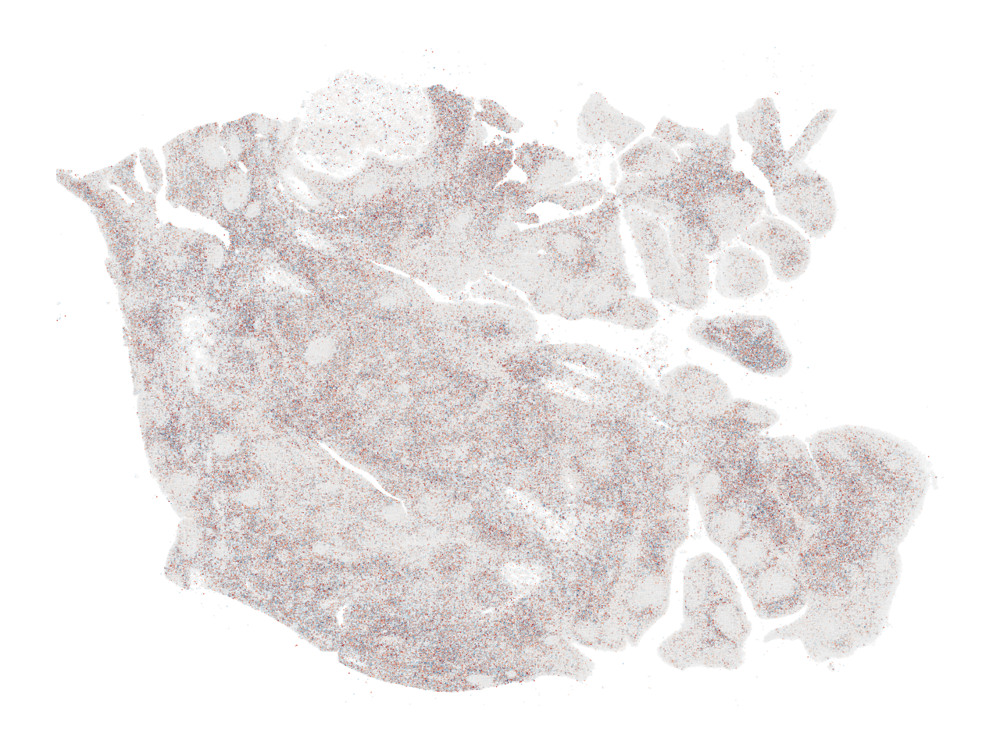

Positive markers:  ['CTLA4', 'LAG3', 'FOXP3', 'GZMK', 'GZMA', 'GNLY', 'KLRD1', 'CCL5', 'CD28', 'NKG7']
Negative markers:  ['CD8A', 'CD3D', 'CD247', 'LAMP3', 'IL7R', 'CCL19', 'CD3E', 'RETN', 'PECAM1', 'CCR7']



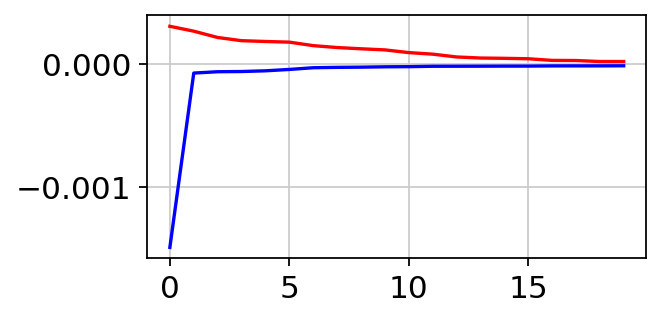

==================== PC3 ====================


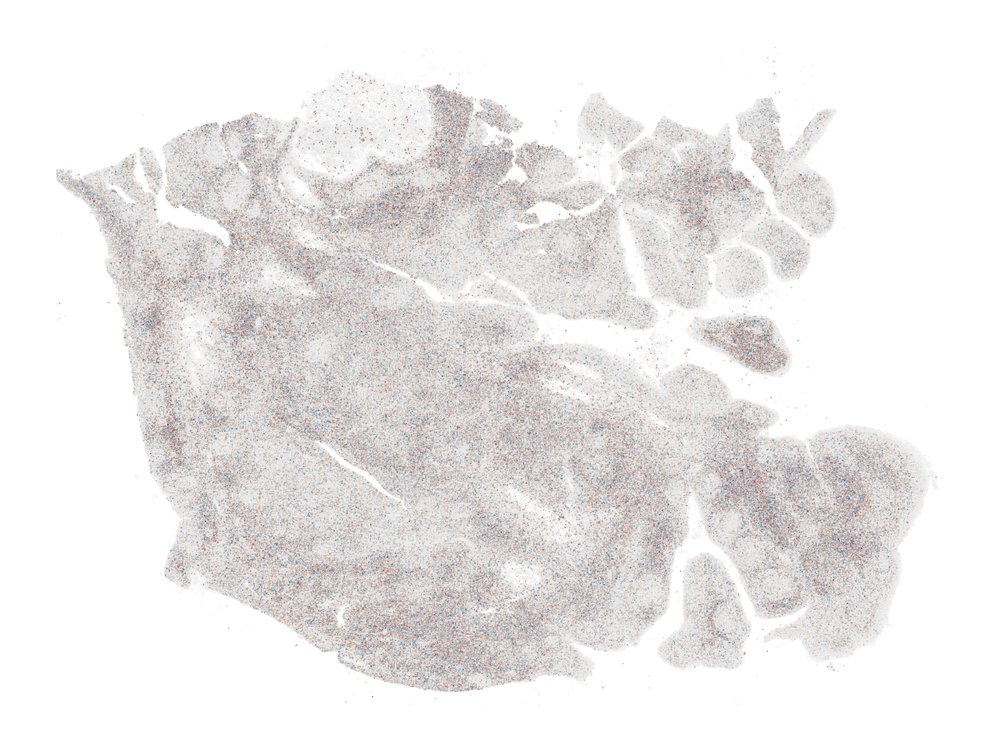

Positive markers:  ['CD247', 'CCR7', 'LAMP3', 'CD3D', 'FOXI1', 'UMOD', 'PPY', 'PECAM1', 'PPP1R1A', 'AHSP']
Negative markers:  ['CTLA4', 'FOXP3', 'CD8A', 'CD28', 'GZMK', 'LAG3', 'CD2', 'GNLY', 'IL7R', 'KLRD1']



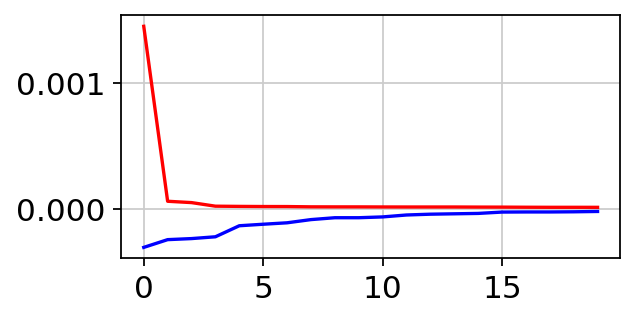

==================== PC4 ====================


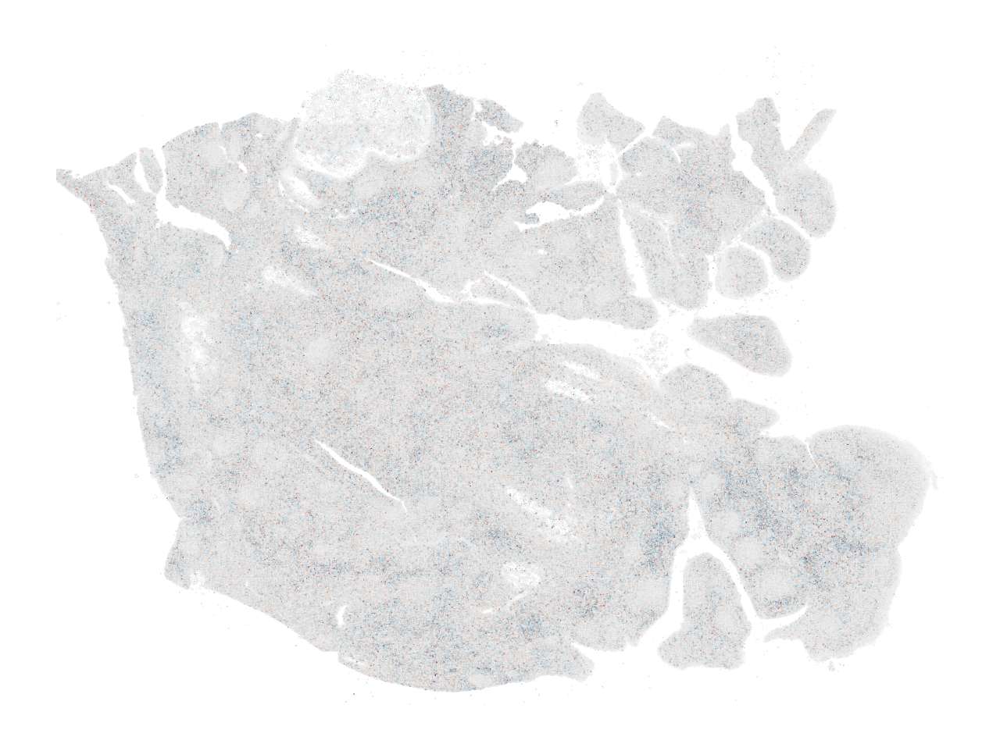

Positive markers:  ['PRF1', 'CD3D', 'CCL19', 'CD3E', 'IL7R', 'GNLY', 'CXCL9', 'GZMK', 'CCR7', 'KLRD1']
Negative markers:  ['FOXP3', 'LAG3', 'CTLA4', 'CD8A', 'CD247', 'LAMP3', 'IL2RA', 'LIF', 'PRDM1', 'RETN']



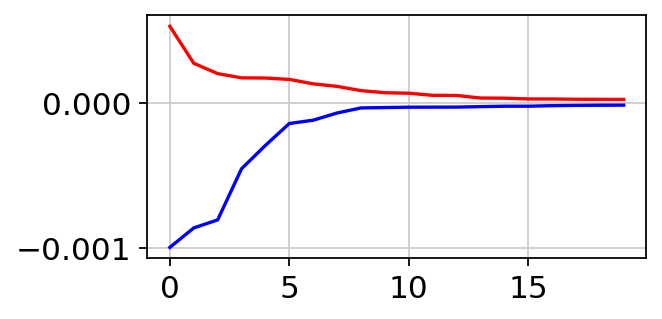

==================== PC5 ====================


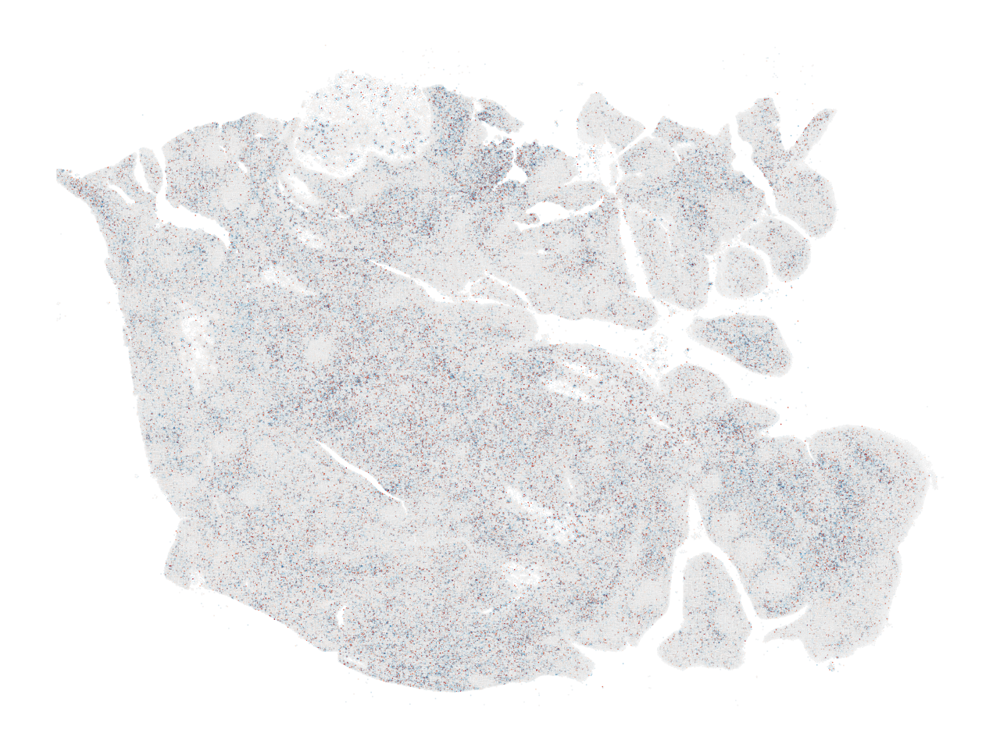

Positive markers:  ['LAG3', 'CD3D', 'CD28', 'GZMA', 'CD3E', 'NKG7', 'CCL5', 'CCR7', 'GZMB', 'PRG4']
Negative markers:  ['PRF1', 'FOXP3', 'GZMK', 'CTLA4', 'CD8A', 'CD247', 'CXCL9', 'KLRC1', 'CCL19', 'GNLY']



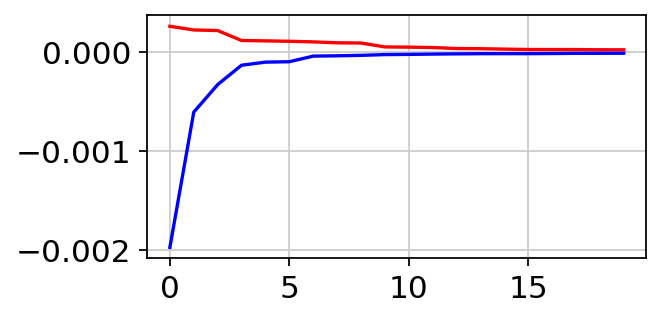

In [14]:
cmap = 'RdBu'
# for i in range(n_comps):
for i in range(5):

    print('='*20, f'PC{i+1}', '='*20)

    # Calculate PC
    c = adata.layers[filter_key] @ V[:,i]
    adata.obs[f'c{i}'] = c

    norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())
    points = adata.obsm['spatial']
    plt.figure(figsize=figsize)
    plt.scatter(
        points[:,0],
        points[:,1],
        edgecolor='k',
        linewidth=0.005,
        s=0.5,
        c=c,
        cmap=cmap,
        norm=norm,
    )
    plt.axis('off')
    filename = os.path.join(figpath, f'juxtacrine_pc{i+1}.png')
    plt.savefig(filename, dpi=dpi)
    plt.show()
    
    # Print markers
    marker_idxs = np.argsort(V[:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]
    print('Positive markers: ', list(pos_marker_genes))
    print('Negative markers: ', list(neg_marker_genes))
    print()
    
    # Print weights
    plt.figure(figsize=(4,2))
    plt.plot(np.sort(V[:,i])[::-1][:20], c='r')
    plt.plot(np.sort(V[:,i])[:20], c='b')
    plt.show()

#### GO terms

In [15]:
n_markers = 5
gene_sets = ['GO_Biological_Process_2023']
organism = 'Human'
cutoff = 0.05

for i in range(n_comps):

    print('='*20, f'PC{i+1}', '='*20)
    
    marker_idxs = np.argsort(adata.varm[f'X_pca_{filter_key}'][:,i])
    pos_marker_genes = adata.var_names[marker_idxs[::-1]][:n_markers]
    neg_marker_genes = adata.var_names[marker_idxs][:n_markers]

    enrichment = gp.enrichr(
        gene_list=list(pos_marker_genes),
        organism=organism,
        gene_sets=gene_sets,
    )
    try:
        df = enrichment.results
        display(df[['Term', 'Adjusted P-value', 'Genes']][df['Adjusted P-value'] < cutoff][:10])
        # fig = gp.barplot(df, title='Positive markers', group='Gene_set', color=['r'], cutoff=cutoff)
        # plt.show()
    except:
        print('No significant terms')

    enrichment = gp.enrichr(
        gene_list=list(neg_marker_genes),
        organism=organism,
        gene_sets=gene_sets,
    )
    try:
        df = enrichment.results
        display(df[['Term', 'Adjusted P-value', 'Genes']][df['Adjusted P-value'] < cutoff][:10])
        # fig = gp.barplot(df, title='Negative markers', group='Gene_set', color=['b'], cutoff=cutoff)
        # plt.show()
    except:
        print('No significant terms')

==================== PC1 ====================


,Term,Adjusted P-value,Genes
0,T Cell Receptor Signaling Pathway (GO:0050852),1.051173e-07,CD8A;CD28;CD247;CD3D
1,T Cell Activation (GO:0042110),1.051173e-07,CD8A;CD28;CD247;CD3D
2,Antigen Receptor-Mediated Signaling Pathway (G...,1.501147e-07,CD8A;CD28;CD247;CD3D
3,Alpha-Beta T Cell Activation (GO:0046631),6.160607e-05,CD247;CD3D
4,T Cell Differentiation (GO:0030217),4.843145e-04,CD8A;CD28
5,Lymphocyte Mediated Immunity (GO:0002449),2.510536e-02,CD8A
6,T Cell Mediated Immunity (GO:0002456),2.510536e-02,CD8A
7,Adaptive Immune Response Based On Somatic Reco...,2.510536e-02,CD8A
8,Fc-gamma Receptor Signaling Pathway (GO:0038094),2.510536e-02,CD247
9,Positive Regulation Of Interleukin-2 Productio...,2.510536e-02,CD28


,Term,Adjusted P-value,Genes
0,Negative Regulation Of Dendritic Cell Apoptoti...,0.000087,CCR7;CCL19
1,Regulation Of Dendritic Cell Apoptotic Process...,0.000087,CCR7;CCL19
2,Response To Prostaglandin E (GO:0034695),0.000087,CCR7;CCL19
3,Negative Regulation Of Leukocyte Apoptotic Pro...,0.000087,CCR7;CCL19
4,Response To Nitric Oxide (GO:0071731),0.000087,CCR7;CCL19
5,Positive Regulation Of Glycoprotein Biosynthet...,0.000103,CCR7;CCL19
6,Dendritic Cell Migration (GO:0036336),0.000152,CCR7;CCL19
7,Positive Regulation Of Neutrophil Chemotaxis (...,0.000152,CCR7;CCL19
8,Response To Ketone (GO:1901654),0.000167,CCR7;CCL19
9,Positive Regulation Of Granulocyte Chemotaxis ...,0.000167,CCR7;CCL19


==================== PC2 ====================


,Term,Adjusted P-value,Genes
0,Regulation Of Regulatory T Cell Differentiatio...,9.342084e-07,LAG3;CTLA4;FOXP3
1,Negative Regulation Of T Cell Differentiation ...,1.577725e-04,LAG3;CTLA4
2,Negative Regulation Of Lymphocyte Proliferatio...,9.966535e-04,CTLA4;FOXP3
3,Regulation Of Immune Response (GO:0050776),2.940452e-03,LAG3;FOXP3
4,Positive Regulation Of Programmed Cell Death (...,1.556264e-02,GZMA;CTLA4
5,Regulation Of T Cell Tolerance Induction (GO:0...,1.556264e-02,FOXP3
6,Regulation Of Endodeoxyribonuclease Activity (...,1.556264e-02,GZMA
7,Positive Regulation Of Apoptotic Process (GO:0...,1.556264e-02,GZMA;CTLA4
8,Negative Regulation Of B Cell Proliferation (G...,1.556264e-02,CTLA4
9,Negative Regulation Of Oxidoreductase Activity...,1.556264e-02,GZMA


,Term,Adjusted P-value,Genes
0,T Cell Receptor Signaling Pathway (GO:0050852),0.000036,CD8A;CD247;CD3D
1,T Cell Activation (GO:0042110),0.000036,CD8A;CD247;CD3D
2,Antigen Receptor-Mediated Signaling Pathway (G...,0.000043,CD8A;CD247;CD3D
3,Alpha-Beta T Cell Activation (GO:0046631),0.000058,CD247;CD3D
4,Lymphocyte Mediated Immunity (GO:0002449),0.021945,CD8A
5,Regulation Of Receptor Signaling Pathway Via S...,0.021945,IL7R
6,Response To Interferon-Alpha (GO:0035455),0.021945,LAMP3
7,T Cell Mediated Immunity (GO:0002456),0.021945,CD8A
8,Adaptive Immune Response Based On Somatic Reco...,0.021945,CD8A
9,Regulation Of Viral Life Cycle (GO:1903900),0.021945,LAMP3


==================== PC3 ====================


,Term,Adjusted P-value,Genes
0,T Cell Activation (GO:0042110),0.000191,CCR7;CD247;CD3D
1,Alpha-Beta T Cell Activation (GO:0046631),0.000304,CD247;CD3D
2,T Cell Receptor Signaling Pathway (GO:0050852),0.008552,CD247;CD3D
3,Response To Cytokine (GO:0034097),0.010201,LAMP3;CCR7
4,Antigen Receptor-Mediated Signaling Pathway (G...,0.010201,CD247;CD3D
5,Establishment Of Lymphocyte Polarity (GO:0001767),0.015606,CCR7
6,Positive Regulation Of Antigen Processing And ...,0.015606,CCR7
7,Positive Regulation Of Dendritic Cell Antigen ...,0.015606,CCR7
8,Positive Regulation Of Humoral Immune Response...,0.015606,CCR7
9,Negative Regulation Of Dendritic Cell Apoptoti...,0.015606,CCR7


,Term,Adjusted P-value,Genes
0,T Cell Differentiation (GO:0030217),0.000011,CD8A;CD28;FOXP3
1,T Cell Receptor Signaling Pathway (GO:0050852),0.000050,CD8A;CD28;CTLA4
2,T Cell Activation (GO:0042110),0.000053,CD8A;CD28;FOXP3
3,Antigen Receptor-Mediated Signaling Pathway (G...,0.000071,CD8A;CD28;CTLA4
4,Regulation Of Regulatory T Cell Differentiatio...,0.000224,CTLA4;FOXP3
5,Negative Regulation Of Lymphocyte Proliferatio...,0.000597,CTLA4;FOXP3
6,Regulation Of Interleukin-10 Production (GO:00...,0.000652,CD28;FOXP3
7,Regulation Of Interleukin-2 Production (GO:003...,0.000652,CD28;FOXP3
8,Regulation Of T Cell Proliferation (GO:0042129),0.001565,CD28;FOXP3
9,Regulation Of Cytokine Production (GO:0001817),0.006612,CD28;FOXP3


==================== PC4 ====================


,Term,Adjusted P-value,Genes
0,T Cell Activation (GO:0042110),0.000244,CCL19;CD3E;CD3D
1,Alpha-Beta T Cell Activation (GO:0046631),0.000388,CD3E;CD3D
2,Positive Regulation Of T Cell Proliferation (G...,0.004298,CCL19;CD3E
3,Positive Regulation Of Lymphocyte Proliferatio...,0.004298,CCL19;CD3E
4,Regulation Of T Cell Proliferation (GO:0042129),0.004298,CCL19;CD3E
5,T Cell Receptor Signaling Pathway (GO:0050852),0.005456,CD3E;CD3D
6,Positive Regulation Of T Cell Activation (GO:0...,0.005932,CCL19;CD3E
7,Antigen Receptor-Mediated Signaling Pathway (G...,0.008135,CD3E;CD3D
8,Protein Import (GO:0017038),0.015819,PRF1
9,Positive Regulation Of Killing Of Cells Of Ano...,0.015819,PRF1


,Term,Adjusted P-value,Genes
0,Regulation Of Regulatory T Cell Differentiatio...,8.996080e-07,LAG3;CTLA4;FOXP3
1,T Cell Receptor Signaling Pathway (GO:0050852),4.020988e-05,CD8A;CTLA4;CD247
2,T Cell Activation (GO:0042110),4.290706e-05,CD8A;CD247;FOXP3
3,Antigen Receptor-Mediated Signaling Pathway (G...,5.678438e-05,CD8A;CTLA4;CD247
4,Negative Regulation Of T Cell Differentiation ...,6.077163e-05,LAG3;CTLA4
5,Negative Regulation Of Lymphocyte Proliferatio...,4.798702e-04,CTLA4;FOXP3
6,T Cell Differentiation (GO:0030217),5.741114e-04,CD8A;FOXP3
7,Regulation Of Immune Response (GO:0050776),1.415773e-03,LAG3;FOXP3
8,Regulation Of T Cell Tolerance Induction (GO:0...,1.299324e-02,FOXP3
9,Negative Regulation Of B Cell Proliferation (G...,1.438979e-02,CTLA4


==================== PC5 ====================


,Term,Adjusted P-value,Genes
0,T Cell Receptor Signaling Pathway (GO:0050852),0.000059,CD28;CD3E;CD3D
1,T Cell Activation (GO:0042110),0.000059,CD28;CD3E;CD3D
2,Antigen Receptor-Mediated Signaling Pathway (G...,0.000069,CD28;CD3E;CD3D
3,Alpha-Beta T Cell Activation (GO:0046631),0.000093,CD3E;CD3D
4,Positive Regulation Of T Cell Proliferation (G...,0.001468,CD28;CD3E
5,Positive Regulation Of Lymphocyte Proliferatio...,0.001473,CD28;CD3E
6,Regulation Of T Cell Proliferation (GO:0042129),0.001473,CD28;CD3E
7,Positive Regulation Of T Cell Activation (GO:0...,0.002490,CD28;CD3E
8,Regulation Of Apoptotic Process (GO:0042981),0.003262,GZMA;CD28;CD3E
9,Negative Regulation Of Macromolecule Metabolic...,0.005996,CD28;CD3E


,Term,Adjusted P-value,Genes
0,T Cell Mediated Immunity (GO:0002456),0.000501,CD8A;PRF1
1,Regulation Of Regulatory T Cell Differentiatio...,0.000501,CTLA4;FOXP3
2,Negative Regulation Of Lymphocyte Proliferatio...,0.001070,CTLA4;FOXP3
3,T Cell Differentiation (GO:0030217),0.001121,CD8A;FOXP3
4,T Cell Receptor Signaling Pathway (GO:0050852),0.003849,CD8A;CTLA4
5,T Cell Activation (GO:0042110),0.004378,CD8A;FOXP3
6,Antigen Receptor-Mediated Signaling Pathway (G...,0.005465,CD8A;CTLA4
7,Protein Import (GO:0017038),0.010869,PRF1
8,Positive Regulation Of Killing Of Cells Of Ano...,0.010869,PRF1
9,Positive Regulation Of Programmed Cell Death (...,0.010869,PRF1;CTLA4


### Zoom 2

In [51]:
i = 0
c = adata.obs['c0']
norm = TwoSlopeNorm(vcenter=0, vmin=c.min(), vmax=c.max())

In [100]:
# Set zoom dims
width = adata.obsm['spatial'][:,0].ptp()
height = adata.obsm['spatial'][:,1].ptp()
# zoom_width = height/15
# zoom_height = zoom_width * 1.3
zoom_width = height/9
zoom_height = zoom_width * 0.6

In [76]:
subdata = sc.pp.subsample(adata, 0.05, copy=True)

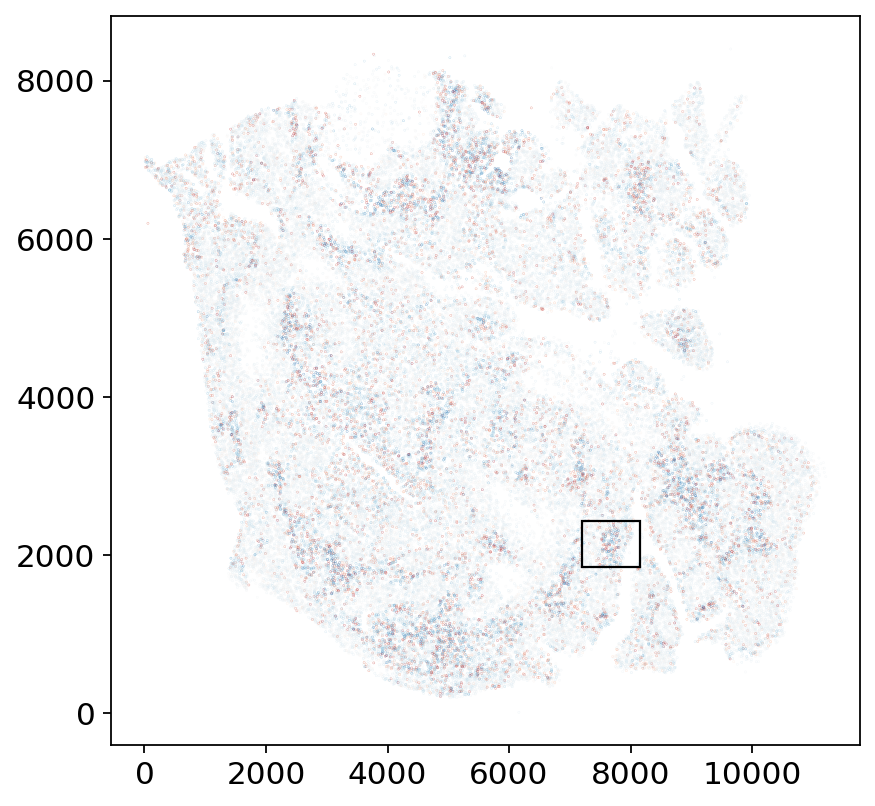

In [101]:
# zoom_x = 3000
# zoom_y = 1500

# zoom_x = 7400
# zoom_y = 1700

zoom_x = 7200
zoom_y = 1850

plt.figure(figsize=(6,6))
plt.scatter(
    *subdata.obsm['spatial'].T,
    # s=0.0001,
    s=0.01,
    c=subdata.obs['c0'],
    cmap=cmap
)
rect = mpl.patches.Rectangle((zoom_x, zoom_y), zoom_width, zoom_height, edgecolor='k', fill=False)
plt.gca().add_patch(rect)
plt.grid(None)
plt.show()

In [102]:
zdata = adata[adata.obsm['spatial'][:,0]>zoom_x]
zdata = zdata[zdata.obsm['spatial'][:,0]<zoom_x+zoom_width]
zdata = zdata[zdata.obsm['spatial'][:,1]>zoom_y]
zdata = zdata[zdata.obsm['spatial'][:,1]<zoom_y+zoom_height]

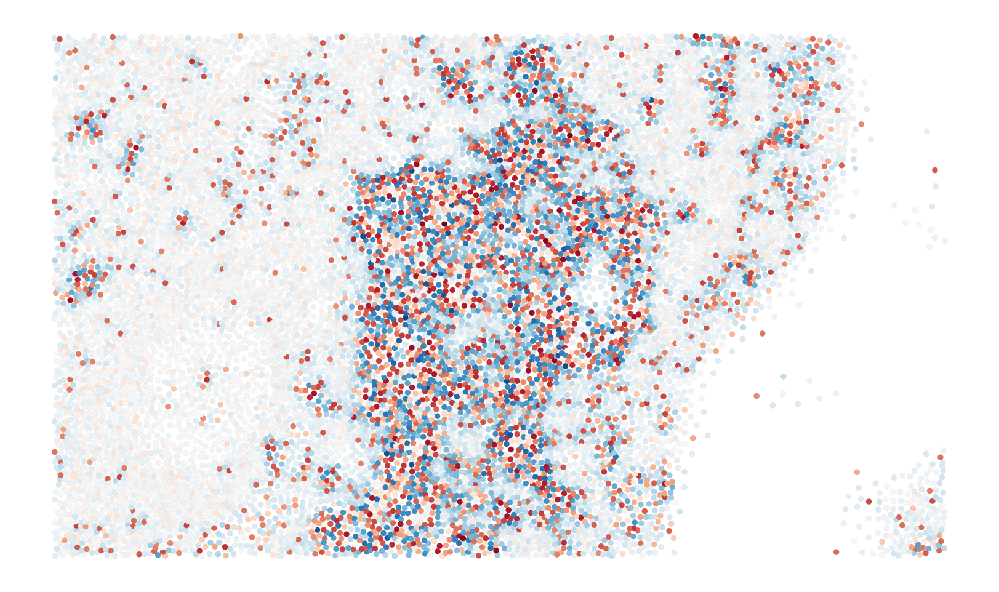

In [104]:
points = zdata.obsm['spatial']
plt.figure(figsize=(height*fignorm*(zoom_width/zoom_height), height*fignorm))
plt.scatter(
    points[:,0],
    points[:,1],
    edgecolor='k',
    linewidth=0.01,
    s=18,
    c=zdata.obs[f'c{i}'],
    cmap=cmap,
    norm=norm,
)
plt.axis('off')
filename = os.path.join(figpath, f'juxtacrine_zoom2_pc{i+1}.png')
plt.savefig(filename, dpi=dpi)
plt.show()